# Polygon data

In [1]:
import geopandas as gpd
import folium
import json
import branca

# Polygon data formats

## Shapefiles

Let's read a shapefile contains polygons.

In [2]:
df = gpd.read_file('Data/polygon/Utrecht_NoordHolland.shp', geometry='geometry')

First few rows in the data

In [3]:
df.head(2)

,mzr_id,mzr_name,wnp_id,wnp_name,gem_id,gem_name,prov_id,prov_name,inhabitant,address_co,NEAR_FID,NEAR_DIST,geometry
0,7142,Wieringerwaard e.o.,3187,Wieringerwaard,1911,Hollands Kroon,27,Noord-Holland,8020.0,3566.0,19990,4006.929967,"POLYGON ((120246.500 527259.100, 120274.000 52..."
1,7108,Nibbixwoud e.o.,3153,Nibbixwoud,420,Medemblik,27,Noord-Holland,4865.0,2340.0,15468,147.141043,"POLYGON ((138590.100 523244.100, 137428.700 52..."


The polygon data consist of the 4-digit postal code zones of two provinces in the Netherlands: Utrecht, and Noord-Holland. This vector data contains 65 polygons - see the rightmost `geometry` column.

The first polygon contains a list of points

In [4]:
print(df.geometry[0])

POLYGON ((120246.5 527259.1000000015, 120274 527220.8000000007, 120321.1999999993 527163.8000000007, 120371.5 527104.1000000015, 120373 527102.1000000015, 120406.5 527055.6999999993, 120435.8000000007 527018.6999999993, 120468.5 526979, 120500.8999999985 526945.1000000015, 120519.5 526927.6000000015, 120546.6999999993 526910.8999999985, 120569.3000000007 526880.8000000007, 120596 526894.6999999993, 120613.6999999993 526921.6000000015, 120691.6000000015 526849.8999999985, 120738.6999999993 526785, 120798.1999999993 526704.6999999993, 120820.5 526674, 120805.1999999993 526648.8999999985, 120748.3999999985 526615.3000000007, 120768.1999999993 526587.5, 120784.5 526564.8000000007, 120832.1000000015 526500, 120902.5 526400.3999999985, 120947.3000000007 526339, 120981.3000000007 526290.1000000015, 121045.8999999985 526199.6000000015, 121079 526153.8000000007, 121098.1999999993 526126.3000000007, 121115 526102.5, 121142.8999999985 526064.6999999993, 121189.3999999985 526000, 121263.3999999985

We can also plot them

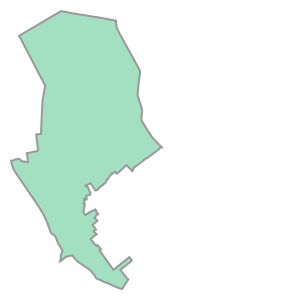

In [5]:
df.geometry[0]

Change CRS

In [6]:
df.to_crs(epsg=4326, inplace=True)

## Quickly visualise using built-in geopandas function

<AxesSubplot:>

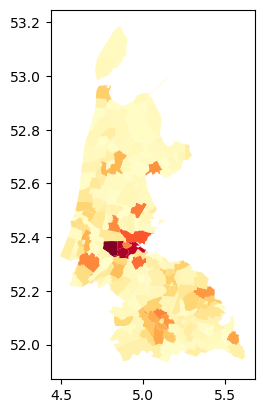

In [7]:
df.plot(column = 'inhabitant', cmap='YlOrRd')

# Polygon data visualisation

## Base map with folium

First, create a base map and specify the center with respect to the speed limit data

In [8]:
map = folium.Map(
    location=[
        df.geometry.to_crs('EPSG:4326').bounds.miny.mean(),
        df.geometry.to_crs('EPSG:4326').bounds.minx.mean()
    ],
    zoom_start=10
)
map

## GeoJson overlay

Similar to the point data, we can include all the polygons into a GeoJson overlay over the base map

In [9]:
map = folium.Map(
    location=[
        df.geometry.to_crs('EPSG:4326').bounds.miny.mean(),
        df.geometry.to_crs('EPSG:4326').bounds.minx.mean()
    ],
    zoom_start=10
)

gjson = folium.features.GeoJson(
    df,
).add_to(map)
map

The overlay only shows the polygon boundaries without any further information like names or populations.

## Choropleth

A Choropleth takes as inputs (1) geometry information and (2) related data.

Let's first see how geometries are represented as geojson strings

In [10]:
df.geometry.__geo_interface__

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {},
   'geometry': {'type': 'Polygon',
    'coordinates': (((4.872705705392342, 52.731584227493926),
      (4.873116838727503, 52.731241801571144),
      (4.873821559640114, 52.730732583625134),
      (4.874572437628975, 52.730199295332554),
      (4.87459485239463, 52.73018141785059),
      (4.87509562581994, 52.729766576303355),
      (4.875533232593482, 52.729435938903286),
      (4.876021445095982, 52.72908125226332),
      (4.876504602395893, 52.72877866644803),
      (4.876781762509811, 52.72862258247425),
      (4.87718613988112, 52.728474232351154),
      (4.877523820934271, 52.72820516981243),
      (4.87791759987743, 52.72833177360631),
      (4.87817680237208, 52.7285746317263),
      (4.87933738753606, 52.727935220105536),
      (4.880041323232016, 52.72735496474874),
      (4.880930382411414, 52.72663709277761),
      (4.881263647930964, 52.726362608650376),
      (4.881039779291

Each geometry is called a `feature`, which consists of the following information.  Let's call them attributes

In [11]:
df.geometry.__geo_interface__['features'][0].keys()

dict_keys(['id', 'type', 'properties', 'geometry', 'bbox'])

The `id` is inherited from the index of the data frame. To be more informative, let's set `mzr_name` as index for the data frame.

In [12]:
df.mzr_id = df.mzr_id.astype(str)
df.set_index('mzr_id', inplace=True)

Now see again the geojson, the id should be `mzr_name`

In [13]:
df.geometry.__geo_interface__

{'type': 'FeatureCollection',
 'features': [{'id': '7142',
   'type': 'Feature',
   'properties': {},
   'geometry': {'type': 'Polygon',
    'coordinates': (((4.872705705392342, 52.731584227493926),
      (4.873116838727503, 52.731241801571144),
      (4.873821559640114, 52.730732583625134),
      (4.874572437628975, 52.730199295332554),
      (4.87459485239463, 52.73018141785059),
      (4.87509562581994, 52.729766576303355),
      (4.875533232593482, 52.729435938903286),
      (4.876021445095982, 52.72908125226332),
      (4.876504602395893, 52.72877866644803),
      (4.876781762509811, 52.72862258247425),
      (4.87718613988112, 52.728474232351154),
      (4.877523820934271, 52.72820516981243),
      (4.87791759987743, 52.72833177360631),
      (4.87817680237208, 52.7285746317263),
      (4.87933738753606, 52.727935220105536),
      (4.880041323232016, 52.72735496474874),
      (4.880930382411414, 52.72663709277761),
      (4.881263647930964, 52.726362608650376),
      (4.881039779

One of these attributes is used to link with the related data.  
When using geopandas dataframe for the related data, `id` is matched with the `index` of the dataframe.

In [14]:
df.head(2)

,mzr_name,wnp_id,wnp_name,gem_id,gem_name,prov_id,prov_name,inhabitant,address_co,NEAR_FID,NEAR_DIST,geometry
mzr_id,,,,,,,,,,,,
7142,Wieringerwaard e.o.,3187,Wieringerwaard,1911,Hollands Kroon,27,Noord-Holland,8020.0,3566.0,19990,4006.929967,"POLYGON ((4.87271 52.73158, 4.87312 52.73124, ..."
7108,Nibbixwoud e.o.,3153,Nibbixwoud,420,Medemblik,27,Noord-Holland,4865.0,2340.0,15468,147.141043,"POLYGON ((5.14447 52.69637, 5.12731 52.69167, ..."


## Create a Choropleth layer

Geometries and associated data

In [15]:
geojson = df['geometry'].__geo_interface__
plot_data = df['inhabitant']

In [16]:
map = folium.Map(
    location=[
        df.geometry.to_crs('EPSG:4326').bounds.miny.mean(),
        df.geometry.to_crs('EPSG:4326').bounds.minx.mean()
    ],
    zoom_start=8
)

folium.features.Choropleth(geo_data=geojson, 
    data=plot_data, 
    key_on="feature.id",
    fill_color='YlOrRd',
    legend_name='population'
    ).add_to(map)

map

## Tooltips

We can enrich the visualisation by showing each zone information when hovering the mouse pointer on

We will use the `GeoJsonToolTip` from folium. It extracts and displays data from the `properties` in geojson features.

In [17]:
geojson = df[['mzr_name', 'gem_name', 'prov_name', 'inhabitant', 'geometry']].to_json()
plot_data = df['inhabitant']

Let's look at one geometry

In [18]:
json.loads(geojson)['features'][0]['properties']

{'gem_name': 'Hollands Kroon',
 'inhabitant': 8020.0,
 'mzr_name': 'Wieringerwaard e.o.',
 'prov_name': 'Noord-Holland'}

In [19]:
map = folium.Map(
    location=[
        df.geometry.to_crs('EPSG:4326').bounds.miny.mean(),
        df.geometry.to_crs('EPSG:4326').bounds.minx.mean()
    ],
    zoom_start=8
)

choropleth = folium.features.Choropleth(geo_data=geojson, 
    data=plot_data, 
    key_on="feature.id",
    fill_color='YlOrRd',
    legend_name='population',
    name='Utrecht_NoordHolland'
    ).add_to(map)

map

folium.GeoJsonTooltip(
    fields=['mzr_name', 'gem_name', 'prov_name', 'inhabitant'],
    aliases=['TAZ name:', 'Municipality Name:', 'Province Name:', 'Population:']
).add_to(choropleth.geojson)

folium.LayerControl().add_to(map)

map